In [38]:
import torch
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display

# Define functions to output model inference results

def to_mono(wave: torch.Tensor) -> torch.Tensor:
    return wave.mean(dim=0) if wave.dim() > 1 else wave

def resample_if_needed(wave: torch.Tensor, orig_sr: int, target_sr: int) -> torch.Tensor:
    if orig_sr == target_sr:
        return wave
    resampler = T.Resample(orig_freq=orig_sr, new_freq=target_sr)
    return resampler(wave.unsqueeze(0)).squeeze(0)

def make_spectrogram_db(wave: torch.Tensor, sr: int, n_fft=1024, hop=256, win=1024, top_db=80):
    spec = T.Spectrogram(n_fft=n_fft, win_length=win, hop_length=hop, power=2.0)(wave.unsqueeze(0))
    spec_db = T.AmplitudeToDB(stype='power', top_db=top_db)(spec.squeeze(0))
    return spec_db

def load_audio_triplet(audio_name: str, generated_dir, dataset_dir="VoiceBank+DEMAND"):
    target, srT = torchaudio.load(f"{generated_dir}/{audio_name}.wav")
    noise, srN = torchaudio.load(f"{dataset_dir}/wavs_noisy/{audio_name}.wav")
    clean, srC = torchaudio.load(f"{dataset_dir}/wavs_clean/{audio_name}.wav")
    return (target, srT), (noise, srN), (clean, srC)

def prepare_signals(signals, srs, target_sr):
    processed = []
    for w, sr in zip(signals, srs):
        w_mono = to_mono(w)
        w_res = resample_if_needed(w_mono, sr, target_sr)
        processed.append(w_res)
    return processed

def plot_triplet(sig_targets, labels, target_sr, n_fft=1024, hop=256, win=1024, top_db=80):
    fig, axes = plt.subplots(2, 3, figsize=(18, 6), constrained_layout=True)
    for i, (w, label) in enumerate(zip(sig_targets, labels)):
        ax_w = axes[0, i]
        time_axis = np.arange(w.shape[-1]) / target_sr
        ax_w.plot(time_axis, w.cpu().numpy(), linewidth=0.6)
        ax_w.set_title(f'{label} — waveform')
        ax_w.set_xlabel('Time (s)')
        ax_w.set_ylabel('Amplitude')
        ax_w.set_xlim(0, time_axis[-1])
        ax_s = axes[1, i]
        spec_db = make_spectrogram_db(w, target_sr, n_fft, hop, win, top_db).cpu().numpy()
        im = ax_s.imshow(spec_db, origin='lower', aspect='auto')
        n_frames = spec_db.shape[1]
        xticks = np.linspace(0, n_frames - 1, 6).astype(int)
        xtick_labels = (xticks * hop / target_sr).round(2)
        ax_s.set_xticks(xticks)
        ax_s.set_xticklabels(xtick_labels)
        ax_s.set_xlabel('Time (s)')
        y_ticks = np.linspace(0, spec_db.shape[0] - 1, 6).astype(int)
        y_freqs = (y_ticks * target_sr / 2 / (spec_db.shape[0] - 1)).round(0)
        ax_s.set_yticks(y_ticks)
        ax_s.set_yticklabels(y_freqs.astype(int))
        ax_s.set_ylabel('Freq (Hz)')
        ax_s.set_title(f'{label} — log-power (dB)')
        cbar = fig.colorbar(im, ax=ax_s, format='%+2.0f dB')
        cbar.ax.yaxis.set_major_locator(plt.MaxNLocator(5))
    plt.show()

def display_audio_triplet(sig_targets, labels, target_sr):
    for w, label in zip(sig_targets, labels):
        print(f"Playback ({label}):")
        display(Audio(w.cpu().numpy(), rate=target_sr))

def visualize_audio_samples(audio_names, generated_dir, dataset_dir="VoiceBank+DEMAND"):
    for name in audio_names:
        print(f"\n=== {name} ===")
        (target, srT), (noise, srN), (clean, srC) = load_audio_triplet(name, generated_dir, dataset_dir)
        TARGET_SR = srT
        sig_targets = prepare_signals([target, noise, clean], [srT, srN, srC], TARGET_SR)
        labels = ['Enhanced (target)', 'Noisy', 'Clean']
        plot_triplet(sig_targets, labels, TARGET_SR)
        display_audio_triplet(sig_targets, labels, TARGET_SR)

https://arxiv.org/pdf/2501.06146v2

# Initial result (baseline, no changes in architecture)

In [1]:
!CUDA_VISIBLE_DEVICES=0,1 python train.py --config config.json --checkpoint_path baseline_model --training_epochs 10 --stdout_interval 100 --best_checkpoint_start_epoch 1 --validation_interval 2900

Initializing Training Process..
Batch size per GPU : 2
MPNet(
  (dense_encoder): DenseEncoder(
    (dense_conv_1): Sequential(
      (0): Conv2d(2, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): PReLU(num_parameters=64)
    )
    (dense_block): DenseBlock(
      (dense_block): ModuleList(
        (0): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 1, 0), value=0.0)
          (1): Conv2d(64, 64, kernel_size=(2, 3), stride=(1, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
          (3): PReLU(num_parameters=64)
        )
        (1): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 2, 0), value=0.0)
          (1): Conv2d(128, 64, kernel_size=(2, 3), stride=(1, 1), dilation=(2, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
          (3): PReLU(num_parameters=64)
  

In [2]:
!python inference.py --checkpoint_file baseline_model/g_best --output_dir baseline_generated_audio

Initializing Inference Process..
Loading 'baseline_model/g_best'
Complete.
Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:00:1900:0100:01


In [3]:
!python cal_metrics/cal_metrics_vb.py --clean_wav_dir VoiceBank+DEMAND/testset_clean --noisy_wav_dir baseline_generated_audio

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:01:5700:0100:03
pesq:  3.352426206747305 csig:  4.601761554824836 cbak:  3.8582649952419215 covl:  4.0710743795771736 ssnr:  10.27028538875069 stoi:  0.9554257611262714



=== p257_378 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

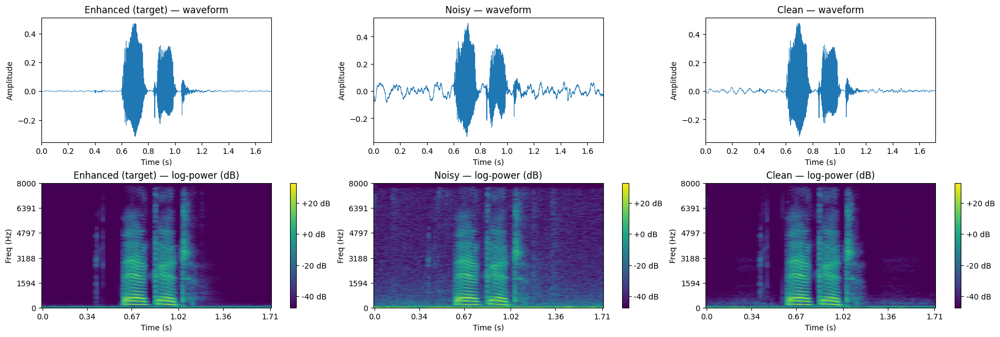

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_001 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

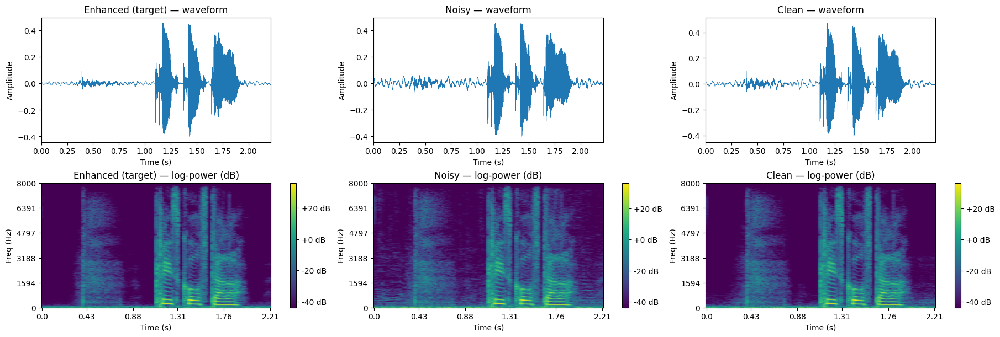

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_002 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

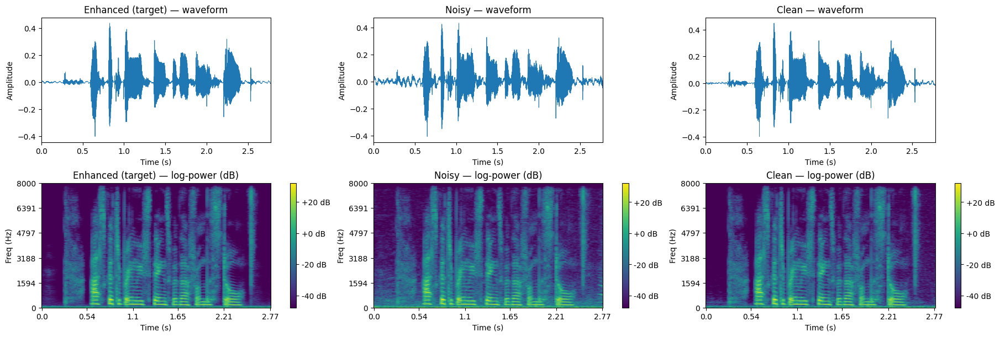

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_003 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

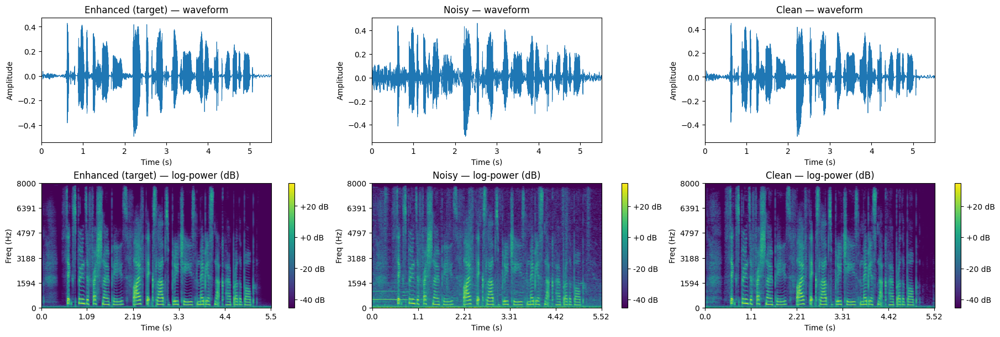

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_004 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

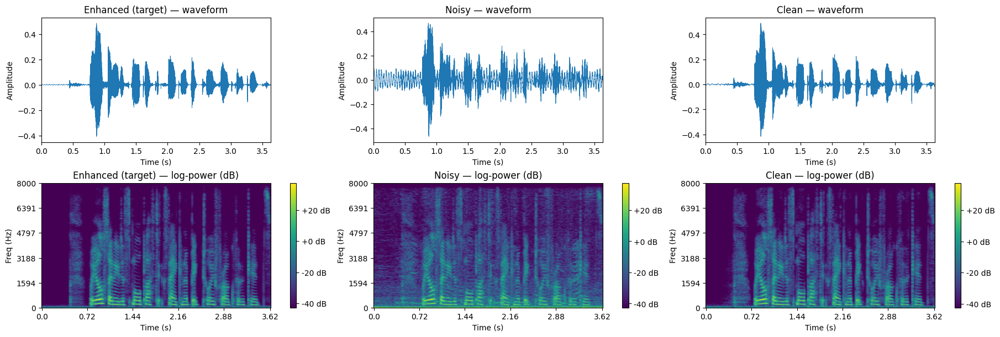

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):


In [21]:
visualize_audio_samples(
    ["p257_378", "p257_001", "p257_002", "p257_003", "p257_004"],
    generated_dir="baseline_generated_audio",
    dataset_dir="VoiceBank+DEMAND"
)

# Traning model with Mamba blocks instead of Transformer blocks

The type of block used in the model is defined in the `config.json` file via the `block_type` field. You can set this field to `"mamba"`, `"xlstm"`, `"mixed"` (see more about that one below), `"transformer"`, or leave it as `None`. If the field is omitted, the model defaults to the baseline architecture with transformer blocks.
The number of blocks is controlled by the `num_tsconformers` parameter. 
When training model with mamba block, `num_tsconformers` was lowered to 2 due to computational limits.

In [34]:
!CUDA_VISIBLE_DEVICES=0,1 python train.py --config config.json --checkpoint_path mamba_model_checkpoint --training_epochs 10 --stdout_interval 100 --best_checkpoint_start_epoch 0 --checkpoint_interval 2000

Initializing Training Process..
Batch size per GPU : 1
Loading 'mamba_model_checkpoint/g_00004000'
MPNet(
  (dense_encoder): DenseEncoder(
    (dense_conv_1): Sequential(
      (0): Conv2d(2, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): PReLU(num_parameters=64)
    )
    (dense_block): DenseBlock(
      (dense_block): ModuleList(
        (0): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 1, 0), value=0.0)
          (1): Conv2d(64, 64, kernel_size=(2, 3), stride=(1, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
          (3): PReLU(num_parameters=64)
        )
        (1): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 2, 0), value=0.0)
          (1): Conv2d(128, 64, kernel_size=(2, 3), stride=(1, 1), dilation=(2, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False

In [35]:
!python inference.py --checkpoint_file mamba_model_checkpoint/g_best --output_dir mamba_generated_audio

Initializing Inference Process..
Loading 'mamba_model_checkpoint/g_best'
Complete.
Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:02:0700:0100:04


In [36]:
!python cal_metrics/cal_metrics_vb.py --clean_wav_dir VoiceBank+DEMAND/testset_clean --noisy_wav_dir mamba_generated_audio

Working... ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100% 0:01:5800:0100:03
pesq:  3.287824141892415 csig:  4.6182687144660255 cbak:  3.8257966524293208 covl:  4.0494176216722 ssnr:  10.216367575345146 stoi:  0.9517368472234251



=== p257_378 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

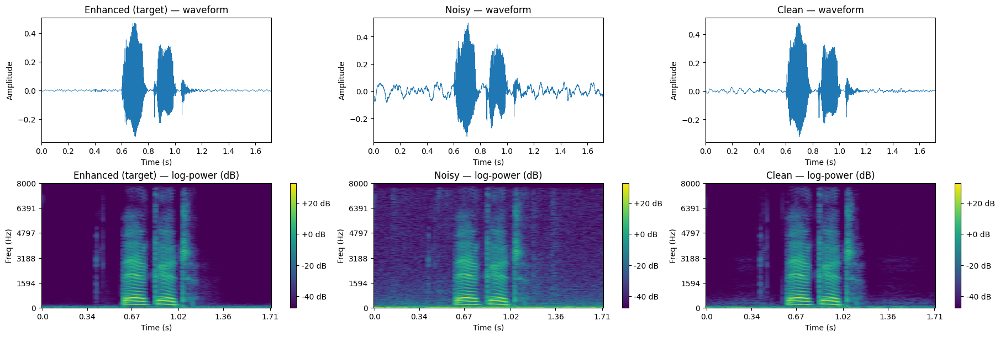

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_001 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

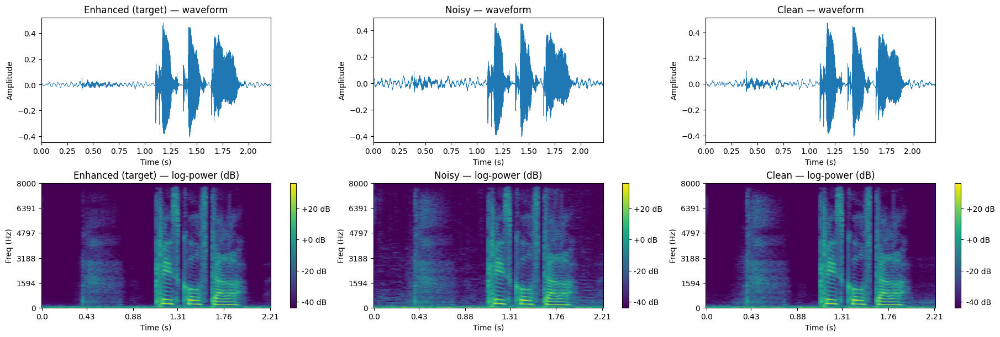

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_002 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

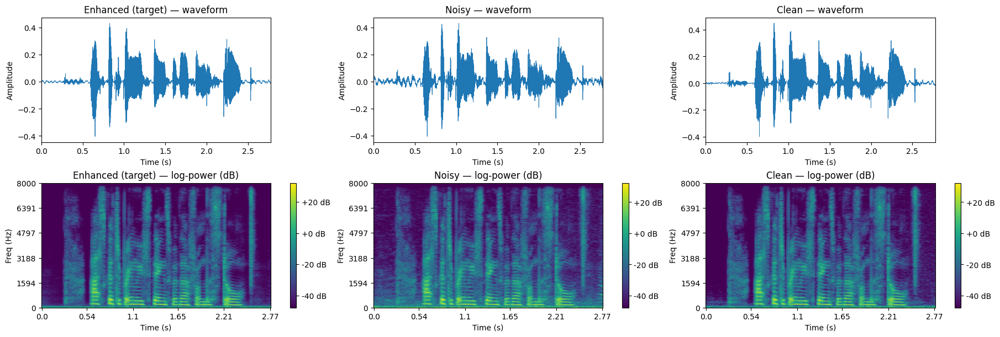

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_003 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

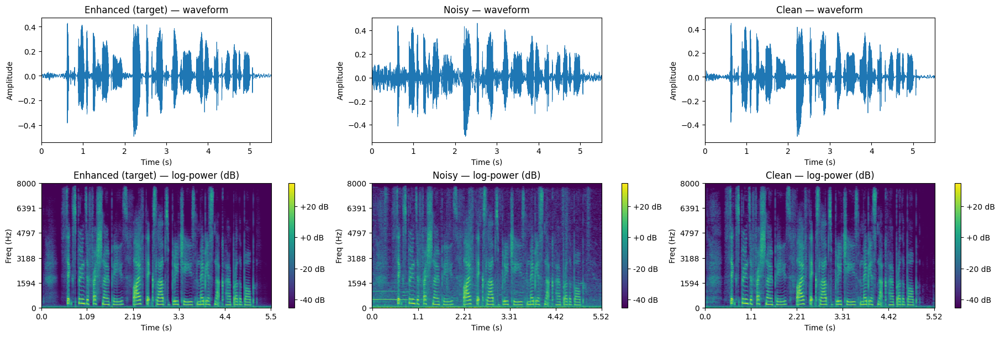

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):



=== p257_004 ===


/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/work/MP-SENet/venv/lib/python3.13/site-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more informa

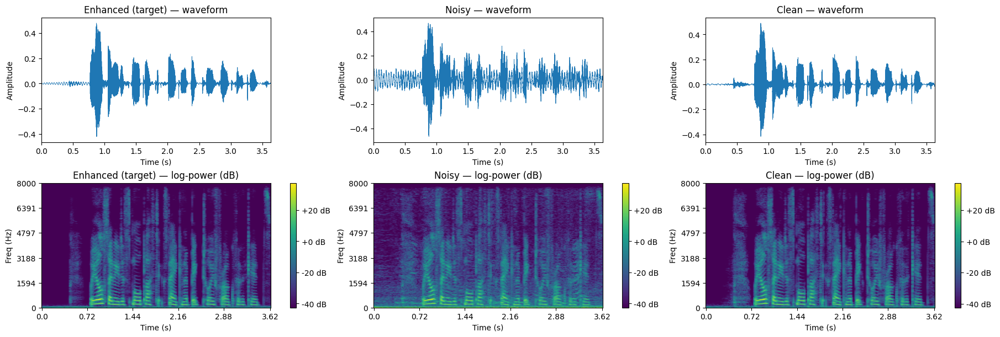

Playback (Enhanced (target)):


Playback (Noisy):


Playback (Clean):


In [39]:
visualize_audio_samples(
    ["p257_378", "p257_001", "p257_002", "p257_003", "p257_004"],
    generated_dir="mamba_generated_audio",
    dataset_dir="VoiceBank+DEMAND"
)

It is obvious that the quality of the model with Mamba blocks is lower, probably due to the fact that the number of blocks was reduced from 4 to 2. However, even with this reduction, the performance remains quite competitive — with only 2 Mamba blocks the model reached a **PESQ of 3.28**, while the baseline Transformer with 4 blocks achieved **3.34**.  
A working implementation of the xLSTM block was also developed, but it could not be run on my GPUs during inference due to memory limitations.  

Recent works such as [MP-SENet-Mamba (Zhao et al., 2025)](https://arxiv.org/pdf/2501.06146v2) and [MP-SENet-xLSTM (Liu et al., 2024)](https://arxiv.org/pdf/2405.06573) demonstrate that incorporating these advanced sequence modeling blocks can significantly improve speech enhancement performance. Considering the results obtained here, it is likely that with more powerful GPUs and longer training (more epochs), these metrics are fully achievable.


# Experiment with mixed blocks

In [41]:
!CUDA_VISIBLE_DEVICES=0,1 python train.py --config config.json --checkpoint_path mixed_model_checkpoint --training_epochs 10 --stdout_interval 100 --best_checkpoint_start_epoch 0 --checkpoint_interval 100 --validation_interval 100

Initializing Training Process..
Batch size per GPU : 1
MPNet(
  (dense_encoder): DenseEncoder(
    (dense_conv_1): Sequential(
      (0): Conv2d(2, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
      (2): PReLU(num_parameters=64)
    )
    (dense_block): DenseBlock(
      (dense_block): ModuleList(
        (0): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 1, 0), value=0.0)
          (1): Conv2d(64, 64, kernel_size=(2, 3), stride=(1, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
          (3): PReLU(num_parameters=64)
        )
        (1): Sequential(
          (0): ConstantPad2d(padding=(1, 1, 2, 0), value=0.0)
          (1): Conv2d(128, 64, kernel_size=(2, 3), stride=(1, 1), dilation=(2, 1))
          (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
          (3): PReLU(num_parameters=64)
  